## **LAB CYCLE 1**

A. Image Negative
1. Implement the image negative transformation function and apply it to a grayscale image.
2. Analyze the effect of image negative on different types of images (e.g., low contrast, high
contrast).
3. Compare the histogram of an original image with its negative. Explain the observed
differences.


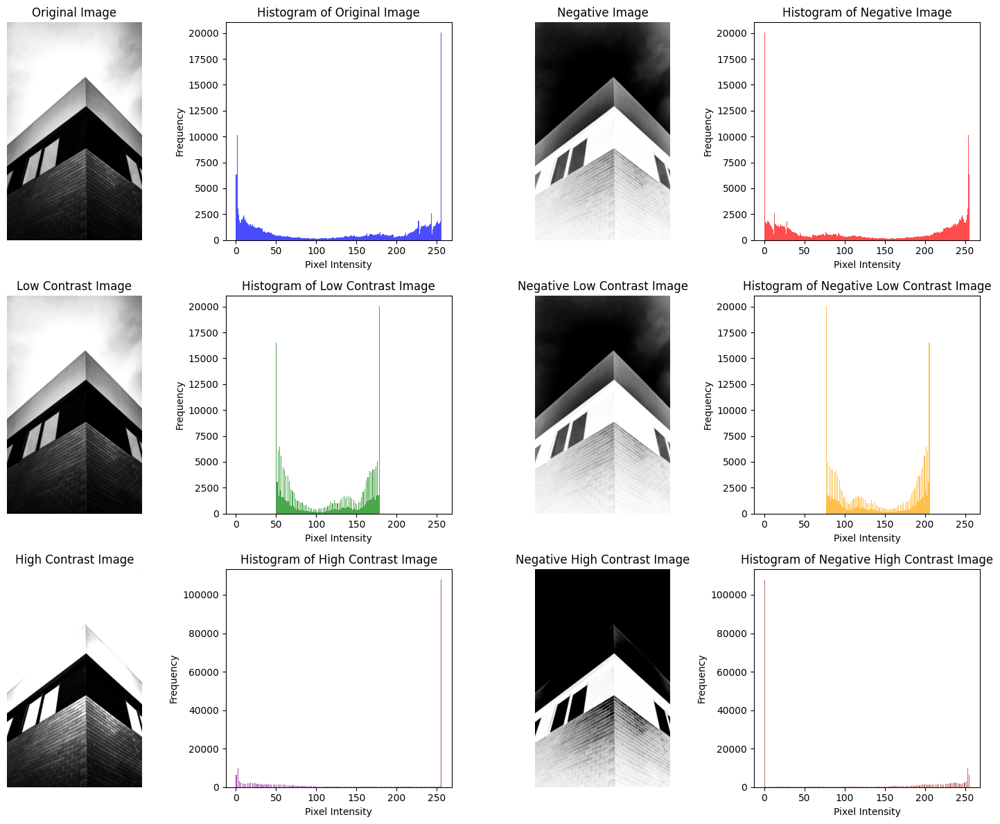

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to compute the negative of an image
def image_negative(image):
    return 255 - image  # For grayscale images, the negative is obtained by subtracting pixel values from 255

# Function to create a low-contrast image
def low_contrast_image(image):
    return cv2.convertScaleAbs(image, alpha=0.5, beta=50)  # Scale pixel values to reduce contrast

# Function to create a high-contrast image
def high_contrast_image(image):
    return cv2.convertScaleAbs(image, alpha=2, beta=0)  # Scale pixel values to increase contrast

# Load a sample grayscale image
image = cv2.imread('/content/image1.png', cv2.IMREAD_GRAYSCALE)  # Replace with your grayscale image path

# Apply the negative transformation
negative_image = image_negative(image)

# Apply low contrast transformation
low_contrast = low_contrast_image(image)
negative_low_contrast = image_negative(low_contrast)

# Apply high contrast transformation
high_contrast = high_contrast_image(image)
negative_high_contrast = image_negative(high_contrast)

# Display images and histograms in a 3x4 grid layout
plt.figure(figsize=(15, 12))

# ROW 1: Original image and its histogram, negative image and its histogram
plt.subplot(3, 4, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(3, 4, 2)
plt.hist(image.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
plt.title("Histogram of Original Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.subplot(3, 4, 3)
plt.imshow(negative_image, cmap='gray')
plt.title("Negative Image")
plt.axis('off')

plt.subplot(3, 4, 4)
plt.hist(negative_image.ravel(), bins=256, range=(0, 256), color='red', alpha=0.7)
plt.title("Histogram of Negative Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# ROW 2: Low contrast image and its histogram, negative low contrast image and its histogram
plt.subplot(3, 4, 5)
plt.imshow(low_contrast, cmap='gray')
plt.title("Low Contrast Image")
plt.axis('off')

plt.subplot(3, 4, 6)
plt.hist(low_contrast.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
plt.title("Histogram of Low Contrast Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.subplot(3, 4, 7)
plt.imshow(negative_low_contrast, cmap='gray')
plt.title("Negative Low Contrast Image")
plt.axis('off')

plt.subplot(3, 4, 8)
plt.hist(negative_low_contrast.ravel(), bins=256, range=(0, 256), color='orange', alpha=0.7)
plt.title("Histogram of Negative Low Contrast Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# ROW 3: High contrast image and its histogram, negative high contrast image and its histogram
plt.subplot(3, 4, 9)
plt.imshow(high_contrast, cmap='gray')
plt.title("High Contrast Image")
plt.axis('off')

plt.subplot(3, 4, 10)
plt.hist(high_contrast.ravel(), bins=256, range=(0, 256), color='purple', alpha=0.7)
plt.title("Histogram of High Contrast Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.subplot(3, 4, 11)
plt.imshow(negative_high_contrast, cmap='gray')
plt.title("Negative High Contrast Image")
plt.axis('off')

plt.subplot(3, 4, 12)
plt.hist(negative_high_contrast.ravel(), bins=256, range=(0, 256), color='brown', alpha=0.7)
plt.title("Histogram of Negative High Contrast Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Show the plots
plt.tight_layout()
plt.show()


B. Log Transformation
1. Implement the log transformation function and apply it to an image with a narrow range of
low gray-level values.
2. Analyze the effect of the log transformation on enhancing details in dark regions of an image.
3. Experiment with different values of the constant 'c' in the log transformation equation and
observe the changes in output image.

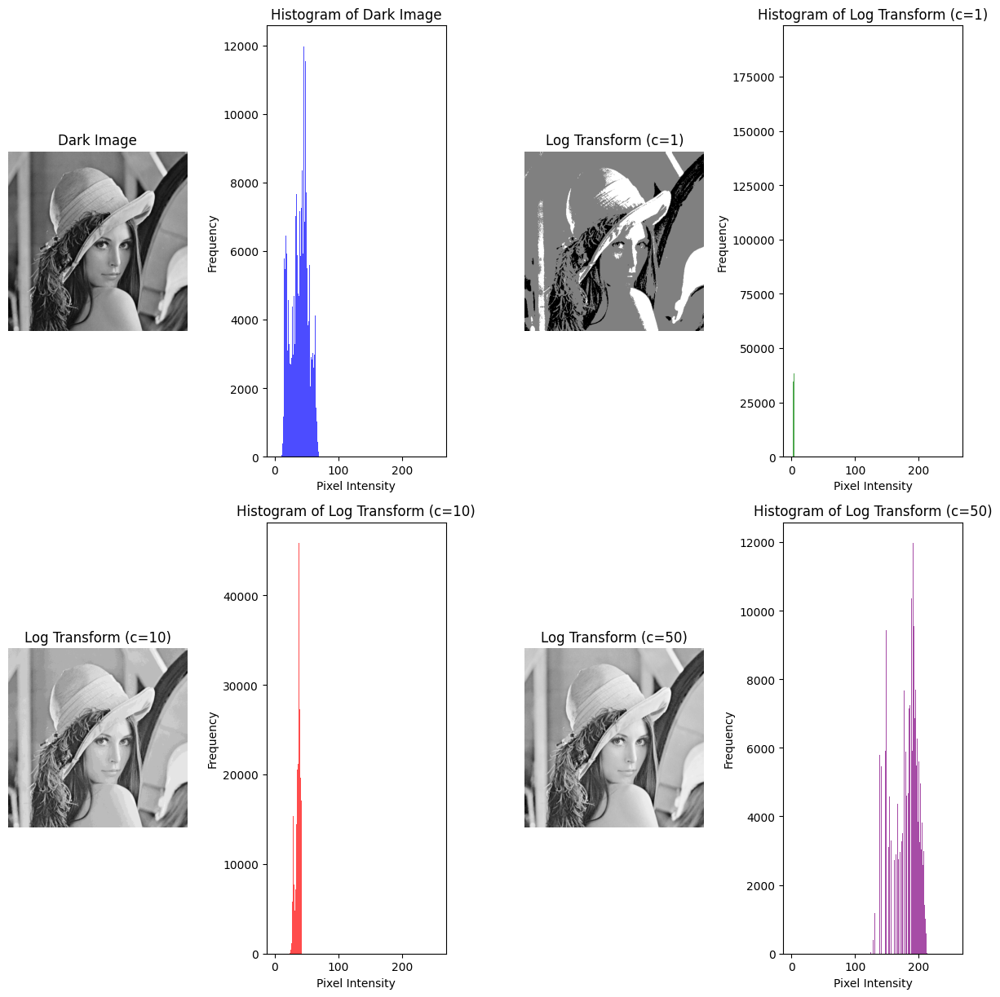

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to apply log transformation to an image
def log_transform(image, c):
    # Apply log transformation: S = c * log(1 + I)
    # Convert to float32 to avoid overflow during log operation
    image_log = c * np.log(1 + image)
    # Normalize to the range [0, 255]
    image_log = np.uint8(np.clip(image_log, 0, 255))
    return image_log

# Load a sample grayscale image
image = cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE)  # Replace with your image path

# Create a narrow range of low gray-level values (dark image)
dark_image = np.uint8(image * 0.3)  # Scale image to create a darker version

# Apply log transformation with different constant values
log_image_c1 = log_transform(dark_image, c=1)
log_image_c2 = log_transform(dark_image, c=10)
log_image_c3 = log_transform(dark_image, c=50)

# Display original image, log-transformed images, and histograms
plt.figure(figsize=(12, 18))

# ROW 1: Original dark image and its histogram
plt.subplot(3, 4, 1)
plt.imshow(dark_image, cmap='gray')
plt.title("Dark Image")
plt.axis('off')

plt.subplot(3, 4, 2)
plt.hist(dark_image.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
plt.title("Histogram of Dark Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# ROW 2: Log-transformed image with c=1, its histogram
plt.subplot(3, 4, 3)
plt.imshow(log_image_c1, cmap='gray')
plt.title("Log Transform (c=1)")
plt.axis('off')

plt.subplot(3, 4, 4)
plt.hist(log_image_c1.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
plt.title("Histogram of Log Transform (c=1)")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# ROW 3: Log-transformed images with different values of 'c', their histograms
plt.subplot(3, 4, 5)
plt.imshow(log_image_c2, cmap='gray')
plt.title("Log Transform (c=10)")
plt.axis('off')

plt.subplot(3, 4, 6)
plt.hist(log_image_c2.ravel(), bins=256, range=(0, 256), color='red', alpha=0.7)
plt.title("Histogram of Log Transform (c=10)")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.subplot(3, 4, 7)
plt.imshow(log_image_c3, cmap='gray')
plt.title("Log Transform (c=50)")
plt.axis('off')

plt.subplot(3, 4, 8)
plt.hist(log_image_c3.ravel(), bins=256, range=(0, 256), color='purple', alpha=0.7)
plt.title("Histogram of Log Transform (c=50)")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Show the plots
plt.tight_layout()
plt.show()


C. Power-Law Transformation
1. Implement the power-law transformation function with different values of gamma.
2. Apply the power-law transformation to enhance images with different contrast characteristics.
3. Analyze the effect of gamma values on the image appearance, especially for values less than
and greater than 1.
4. Experiment with different image types (e.g., medical, satellite, natural) to observe the impact
of transformations.

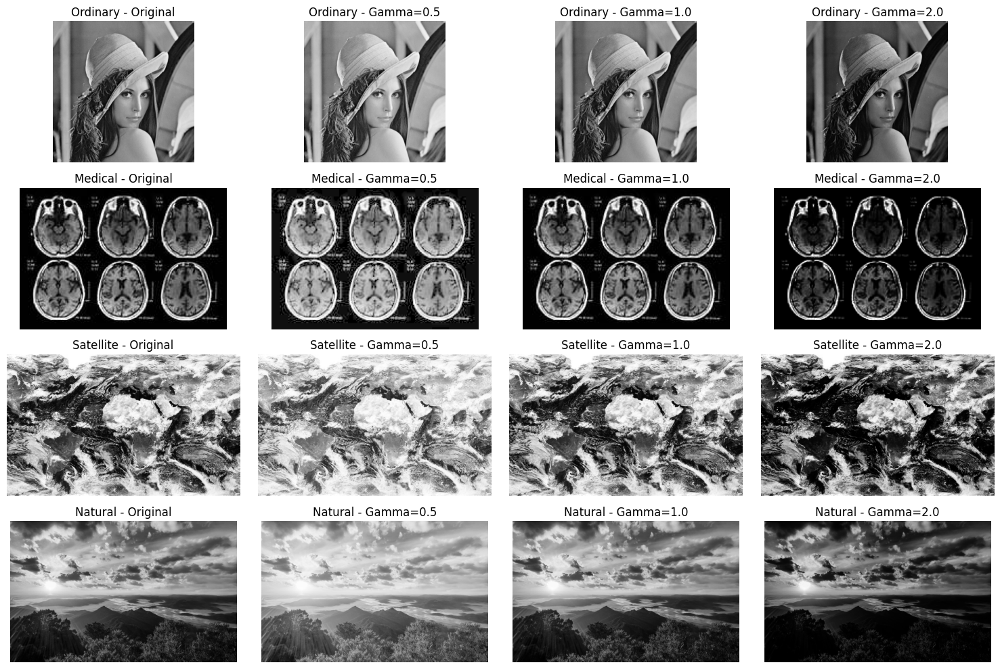

In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Power-law transformation function
def power_law_transformation(image, gamma=1.0, c=1.0):
    # Convert image to float32 and normalize to [0, 1]
    image_float = np.float32(image) / 255.0
    # Apply power-law transformation
    power_law_image = c * np.power(image_float, gamma)
    # Scale back to the 8-bit range
    power_law_image = np.uint8(255 * power_law_image)
    return power_law_image

# Load different types of images
images = {
    'Ordinary': cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE),
    'Medical': cv2.imread('/content/medical.jpg', cv2.IMREAD_GRAYSCALE),
    'Satellite': cv2.imread('/content/satellite.jpg', cv2.IMREAD_GRAYSCALE),
    'Natural': cv2.imread('/content/nature.jpg', cv2.IMREAD_GRAYSCALE)
}

# Gamma values to test
gammas = [0.5, 1.0, 2.0]

# Plotting the images in rows, with each row corresponding to a different image type
fig, axes = plt.subplots(len(images), len(gammas) + 1, figsize=(15, 10))

for row, (title, image) in enumerate(images.items()):
    # Display the original image in the first column
    axes[row, 0].imshow(image, cmap='gray')
    axes[row, 0].set_title(f'{title} - Original')
    axes[row, 0].axis('off')

    # Display transformed images for each gamma value
    for col, gamma in enumerate(gammas, start=1):
        transformed_image = power_law_transformation(image, gamma)
        axes[row, col].imshow(transformed_image, cmap='gray')
        axes[row, col].set_title(f'{title} - Gamma={gamma}')
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()



D. Spatial Filtering
1. Implement mean, median, and Gaussian filters. Apply them to images with different noise
types (salt-and-pepper, Gaussian) and compare the results.
2. Design a custom filter for sharpening edges while preserving image details. Apply it to a
natural image and evaluate its performance.
3. Experiment with different Laplacian operators (4-connected, 8-connected) and compare their
edge detection capabilities.

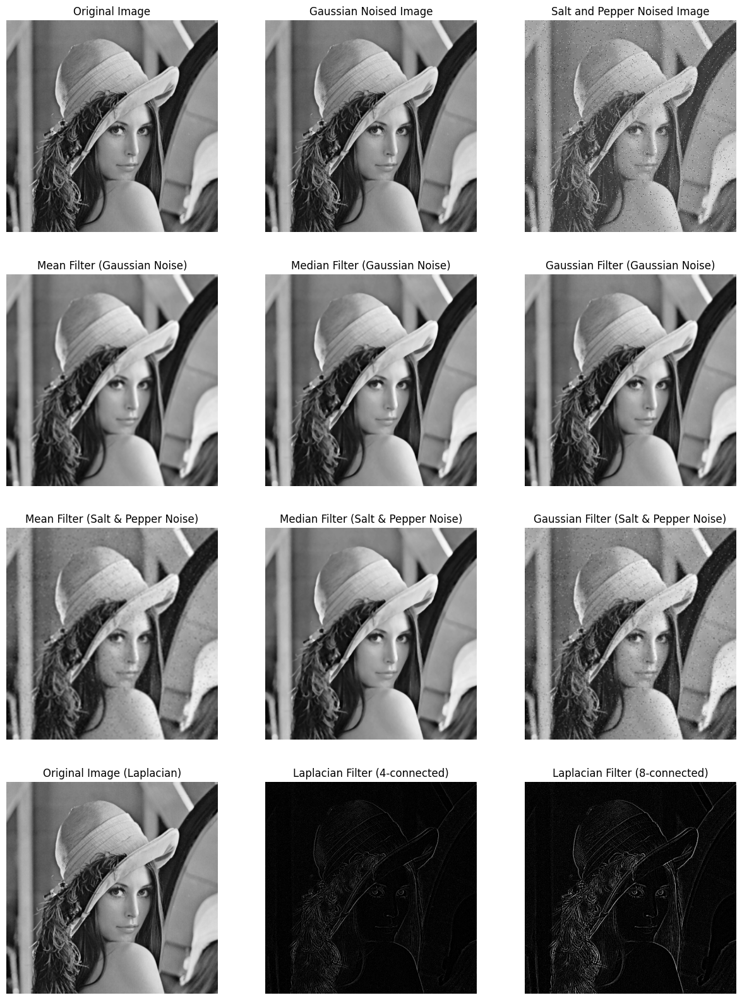

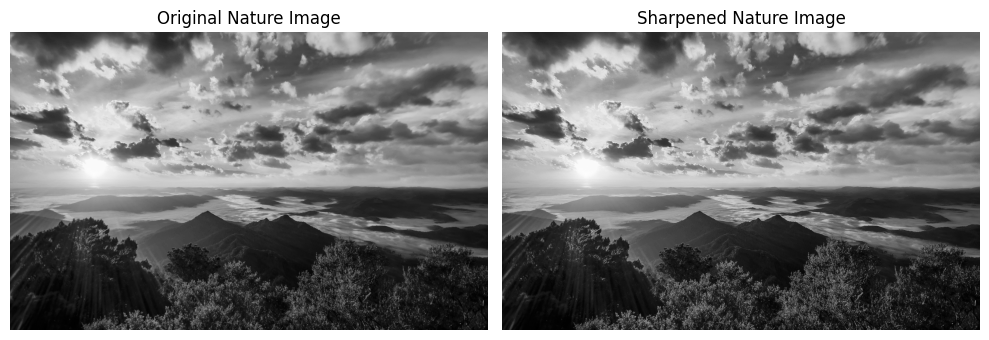

In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=0.1):
    row, col = image.shape
    sigma = var ** 0.5
    gaussian = np.random.normal(mean, sigma, (row, col))
    noisy_image = np.uint8(np.clip(image + gaussian, 0, 255))
    return noisy_image

# Function to add salt and pepper noise
def add_salt_and_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy_image = image.copy()
    total_pixels = image.size
    num_salt = int(total_pixels * salt_prob)
    num_pepper = int(total_pixels * pepper_prob)

    # Add salt noise
    salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255

    # Add pepper noise
    pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0

    return noisy_image

# Function to apply a custom sharpening filter
def sharpen_image(image):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

# Function to apply Laplacian filter (4-connected)
def laplacian_4_connected(image):
    kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
    return cv2.filter2D(image, -1, kernel)

# Function to apply Laplacian filter (8-connected)
def laplacian_8_connected(image):
    kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])
    return cv2.filter2D(image, -1, kernel)

# Load images
image = cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE)  # Replace with your normal image path
nature_image = cv2.imread('/content/nature.jpg', cv2.IMREAD_GRAYSCALE)  # Replace with your nature image path

# Add noise to images
gaussian_noised_image = add_gaussian_noise(image)
salt_pepper_noised_image = add_salt_and_pepper_noise(image)

# Apply spatial filters
mean_filter_gaussian = cv2.blur(gaussian_noised_image, (5, 5))
median_filter_gaussian = cv2.medianBlur(gaussian_noised_image, 5)
gaussian_filter_gaussian = cv2.GaussianBlur(gaussian_noised_image, (5, 5), 0)

mean_filter_salt_pepper = cv2.blur(salt_pepper_noised_image, (5, 5))
median_filter_salt_pepper = cv2.medianBlur(salt_pepper_noised_image, 5)
gaussian_filter_salt_pepper = cv2.GaussianBlur(salt_pepper_noised_image, (5, 5), 0)

# Apply edge sharpening filter
sharpened_image = sharpen_image(nature_image)

# Apply Laplacian filters
laplacian_4_image = laplacian_4_connected(image)
laplacian_8_image = laplacian_8_connected(image)

# Display images and results in a 4x3 grid
plt.figure(figsize=(15, 20))

# Row 1: Original, Gaussian noised, and Salt-and-Pepper noised images
plt.subplot(4, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(4, 3, 2)
plt.imshow(gaussian_noised_image, cmap='gray')
plt.title("Gaussian Noised Image")
plt.axis('off')

plt.subplot(4, 3, 3)
plt.imshow(salt_pepper_noised_image, cmap='gray')
plt.title("Salt and Pepper Noised Image")
plt.axis('off')

# Row 2: Filters applied on Gaussian noised image
plt.subplot(4, 3, 4)
plt.imshow(mean_filter_gaussian, cmap='gray')
plt.title("Mean Filter (Gaussian Noise)")
plt.axis('off')

plt.subplot(4, 3, 5)
plt.imshow(median_filter_gaussian, cmap='gray')
plt.title("Median Filter (Gaussian Noise)")
plt.axis('off')

plt.subplot(4, 3, 6)
plt.imshow(gaussian_filter_gaussian, cmap='gray')
plt.title("Gaussian Filter (Gaussian Noise)")
plt.axis('off')

# Row 3: Filters applied on Salt and Pepper noised image
plt.subplot(4, 3, 7)
plt.imshow(mean_filter_salt_pepper, cmap='gray')
plt.title("Mean Filter (Salt & Pepper Noise)")
plt.axis('off')

plt.subplot(4, 3, 8)
plt.imshow(median_filter_salt_pepper, cmap='gray')
plt.title("Median Filter (Salt & Pepper Noise)")
plt.axis('off')

plt.subplot(4, 3, 9)
plt.imshow(gaussian_filter_salt_pepper, cmap='gray')
plt.title("Gaussian Filter (Salt & Pepper Noise)")
plt.axis('off')

# Row 4: Laplacian filters and original image
plt.subplot(4, 3, 10)
plt.imshow(image, cmap='gray')
plt.title("Original Image (Laplacian)")
plt.axis('off')

plt.subplot(4, 3, 11)
plt.imshow(laplacian_4_image, cmap='gray')
plt.title("Laplacian Filter (4-connected)")
plt.axis('off')

plt.subplot(4, 3, 12)
plt.imshow(laplacian_8_image, cmap='gray')
plt.title("Laplacian Filter (8-connected)")
plt.axis('off')

# Row 5: Original nature image and sharpened image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(nature_image, cmap='gray')
plt.title("Original Nature Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sharpened_image, cmap='gray')
plt.title("Sharpened Nature Image")
plt.axis('off')

# Show the plots
plt.tight_layout()
plt.show()


E. Image Enhancement: Arithmetic/Logic Operations
4. Implement image subtraction to detect changes between two images (e.g., before and after an
event).
5. Create a simple image watermarking system using image addition and subtraction.
6. Experiment with image averaging to reduce noise in a sequence of images.

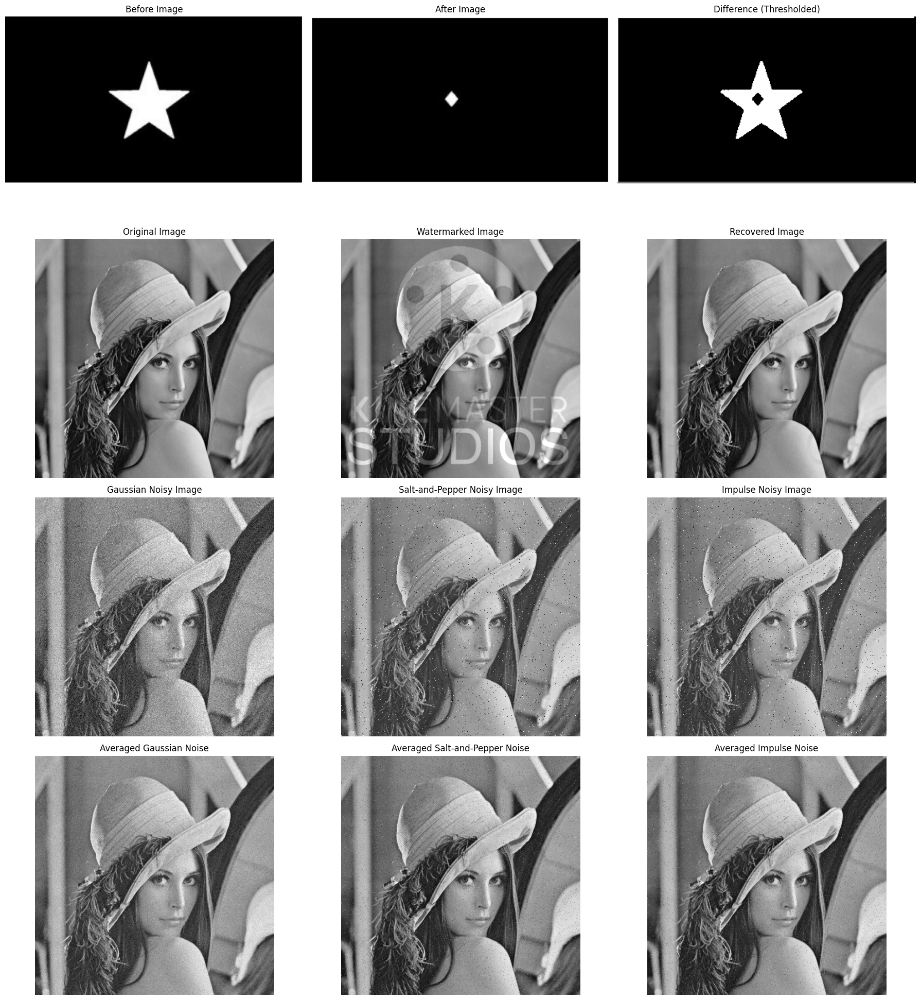

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images for before/after comparison
before = cv2.imread('/content/input1.png', cv2.IMREAD_COLOR)
after = cv2.imread('/content/input2.png', cv2.IMREAD_COLOR)

# Ensure both images are in the same color space
before = cv2.cvtColor(before, cv2.COLOR_BGR2RGB)
after = cv2.cvtColor(after, cv2.COLOR_BGR2RGB)

# Resize images to the same dimensions
if before.shape != after.shape:
    after = cv2.resize(after, (before.shape[1], before.shape[0]))

# Perform absolute difference
difference = cv2.absdiff(before, after)

# Convert the difference image to grayscale
difference_gray = cv2.cvtColor(difference, cv2.COLOR_RGB2GRAY)

# Apply threshold to highlight significant changes
_, thresh_diff = cv2.threshold(difference_gray, 30, 255, cv2.THRESH_BINARY)

# Load the original image and watermark for watermarking example
original = cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE)
watermark = cv2.imread('/content/watermark.png', cv2.IMREAD_GRAYSCALE)

# Resize the watermark to match the size of the original image
watermark = cv2.resize(watermark, (original.shape[1], original.shape[0]))

# Normalize watermark intensity to scale it
watermark = cv2.normalize(watermark, None, 0, 50, cv2.NORM_MINMAX)

# Embed the watermark into the original image
watermarked_image = cv2.add(original, watermark)

# Recover the original image by subtracting the watermark
recovered_image = cv2.subtract(watermarked_image, watermark)

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, stddev=20):
    noise = np.random.normal(mean, stddev, image.shape).astype(np.float32)
    noisy_image = cv2.add(image.astype(np.float32), noise)
    return np.clip(noisy_image, 0, 255).astype(np.uint8)

# Function to add Salt-and-Pepper noise
def add_salt_and_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy_image = image.copy()
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)

    # Add salt noise (white pixels)
    salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255

    # Add pepper noise (black pixels)
    pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0

    return noisy_image

# Function to add Impulse noise
def add_impulse_noise(image, prob=0.01):
    noisy_image = image.copy()
    mask = np.random.choice([0, 1, 2], size=image.shape, p=[prob, prob, 1 - 2 * prob])
    noisy_image[mask == 0] = 0  # Black (pepper)
    noisy_image[mask == 1] = 255  # White (salt)
    return noisy_image

# Generate noisy images
gaussian_noisy_images = [add_gaussian_noise(original) for _ in range(5)]
salt_and_pepper_noisy_images = [add_salt_and_pepper_noise(original) for _ in range(5)]
impulse_noisy_images = [add_impulse_noise(original) for _ in range(5)]

# Perform image averaging for each noise type
def average_images(images):
    accumulator = np.zeros_like(images[0], dtype=np.float32)
    for img in images:
        accumulator += img.astype(np.float32)
    return (accumulator / len(images)).astype(np.uint8)

# Average noisy images
averaged_gaussian = average_images(gaussian_noisy_images)
averaged_salt_and_pepper = average_images(salt_and_pepper_noisy_images)
averaged_impulse = average_images(impulse_noisy_images)

# Display the results in 4 rows and 3 columns
plt.figure(figsize=(18, 20))

# Row 1: Before, After, and Difference Image
plt.subplot(4, 3, 1)
plt.title("Before Image")
plt.imshow(before)
plt.axis('off')

plt.subplot(4, 3, 2)
plt.title("After Image")
plt.imshow(after)
plt.axis('off')

plt.subplot(4, 3, 3)
plt.title("Difference (Thresholded)")
plt.imshow(thresh_diff, cmap='gray')
plt.axis('off')

# Row 2: Watermarked and Recovered Image
plt.subplot(4, 3, 4)
plt.title("Original Image")
plt.imshow(original, cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 5)
plt.title("Watermarked Image")
plt.imshow(watermarked_image, cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 6)
plt.title("Recovered Image")
plt.imshow(recovered_image, cmap='gray')
plt.axis('off')

# Row 3: Noisy Images (Gaussian, Salt-and-Pepper, Impulse)
plt.subplot(4, 3, 7)
plt.title("Gaussian Noisy Image")
plt.imshow(gaussian_noisy_images[0], cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 8)
plt.title("Salt-and-Pepper Noisy Image")
plt.imshow(salt_and_pepper_noisy_images[0], cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 9)
plt.title("Impulse Noisy Image")
plt.imshow(impulse_noisy_images[0], cmap='gray')
plt.axis('off')

# Row 4: Averaged Noisy Images
plt.subplot(4, 3, 10)
plt.title("Averaged Gaussian Noise")
plt.imshow(averaged_gaussian, cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 11)
plt.title("Averaged Salt-and-Pepper Noise")
plt.imshow(averaged_salt_and_pepper, cmap='gray')
plt.axis('off')

plt.subplot(4, 3, 12)
plt.title("Averaged Impulse Noise")
plt.imshow(averaged_impulse, cmap='gray')
plt.axis('off')

# Display results
plt.tight_layout()
plt.show()



# **LAB CYCLE 2**
A. Image Transform
1. Perform Discrete Fourier Transform, Z- transform KL Transform on a gray scale image.



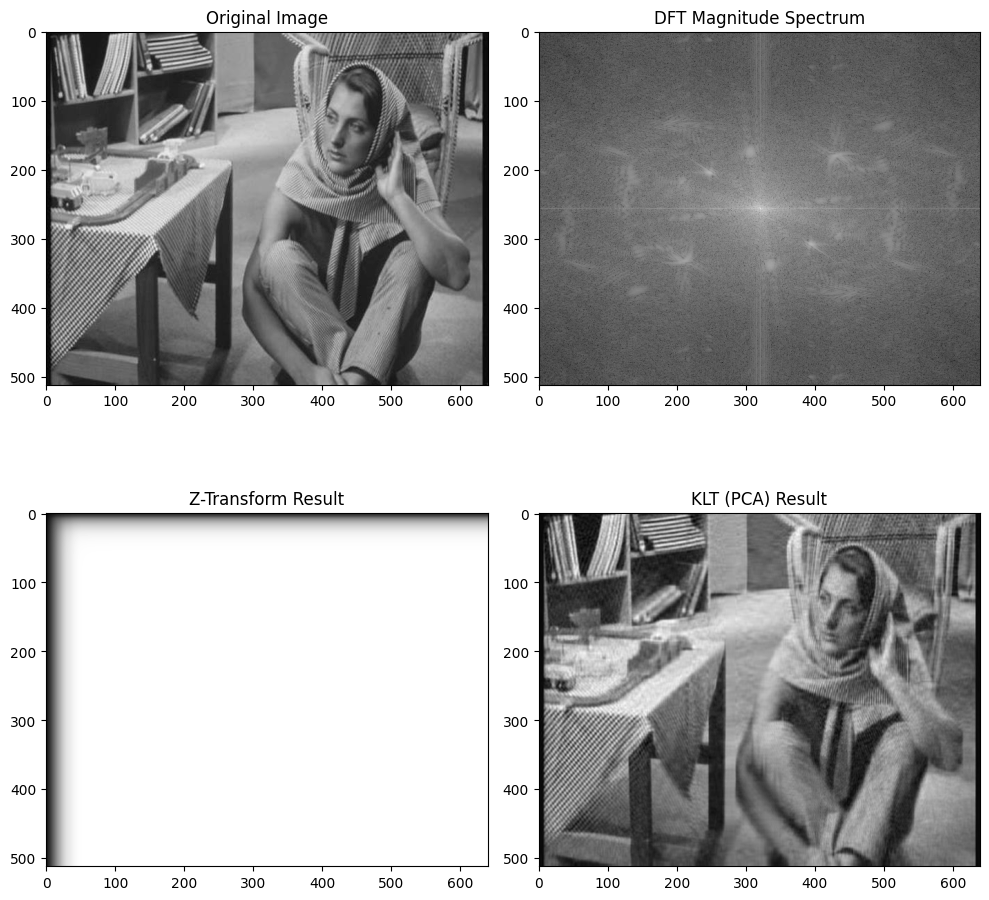

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the grayscale image
image = cv2.imread('/content/barbara.jpg', cv2.IMREAD_GRAYSCALE)

# --- 1. Discrete Fourier Transform (DFT) ---
def perform_dft(image):
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
    return magnitude_spectrum

dft_result = perform_dft(image)

# --- 2. Z-Transform ---
def z_transform(image, a=0.9):
    rows, cols = image.shape
    z_transformed = np.zeros_like(image, dtype=np.float32)

    for r in range(rows):
        z_transformed[r, :] = np.cumsum(image[r, :] * (a ** np.arange(cols)))

    for c in range(cols):
        z_transformed[:, c] = np.cumsum(z_transformed[:, c] * (a ** np.arange(rows)))

    return z_transformed

z_transform_result = z_transform(image)

# --- 3. Karhunen–Loève Transform (KLT, using PCA) ---
def kl_transform(image, n_components=20):
    rows, cols = image.shape
    flat_image = image.reshape(-1, cols)

    # Perform PCA (KLT Approximation)
    pca = PCA(n_components=n_components)
    reduced = pca.fit_transform(flat_image)
    reconstructed = pca.inverse_transform(reduced)
    return reconstructed.reshape(rows, cols)

klt_result = kl_transform(image, n_components=50)

# --- Display Results ---
plt.figure(figsize=(10, 10))

# Original Image
plt.subplot(2, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

# DFT Result
plt.subplot(2, 2, 2)
plt.title("DFT Magnitude Spectrum")
plt.imshow(dft_result, cmap='gray')

# Z-Transform Result
plt.subplot(2, 2, 3)
plt.title("Z-Transform Result")
plt.imshow(z_transform_result, cmap='gray')

# KLT Result
plt.subplot(2, 2, 4)
plt.title("KLT (PCA) Result")
plt.imshow(klt_result, cmap='gray')

plt.tight_layout()
plt.show()


B. Intensity Transformation and Histogram Processing
1. Implement histogram equalization and matching on a grayscale image. Compare the results
visually and quantitatively using metrics like entropy.
2. Design a contrast enhancement technique for images with low contrast. Apply it to a real-
world image and evaluate its effectiveness.



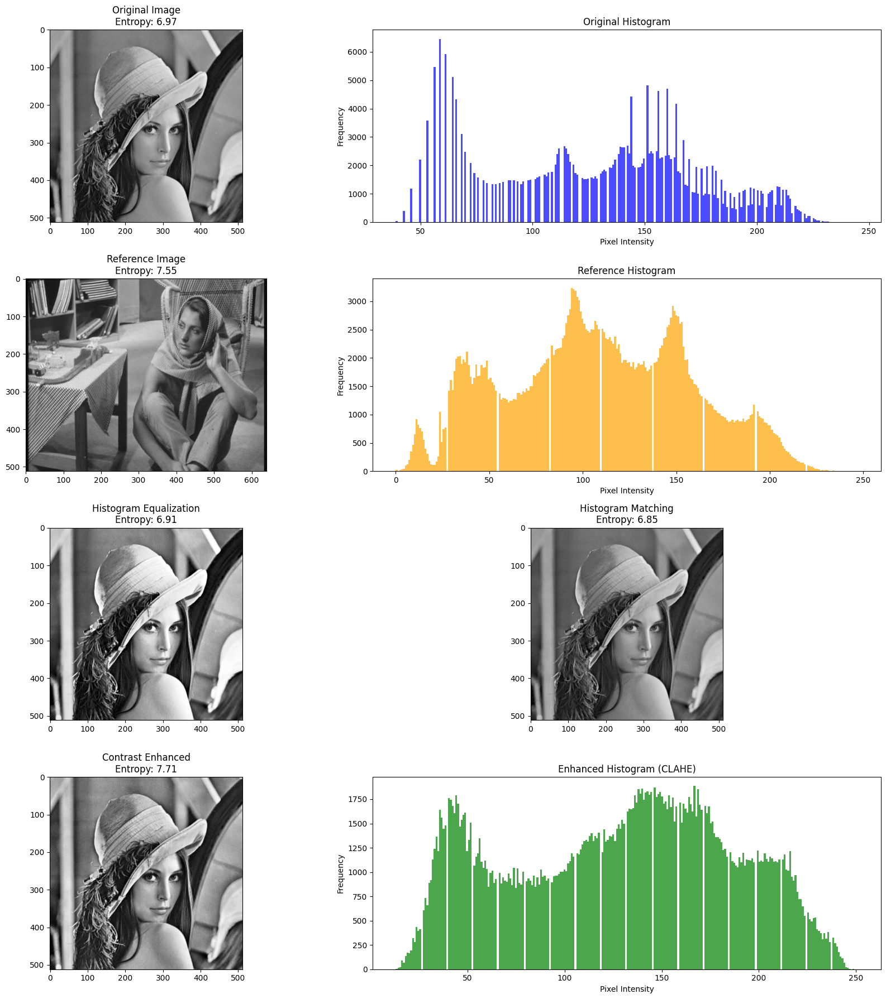

In [26]:
import cv2
import numpy as np
from skimage import exposure
from skimage.measure import shannon_entropy
import matplotlib.pyplot as plt

# Load a grayscale image
image = cv2.imread("/content/lenna.png", cv2.IMREAD_GRAYSCALE)

# Load a reference image for histogram matching
reference_image = cv2.imread("/content/barbara.jpg", cv2.IMREAD_GRAYSCALE)

# --- 1. Histogram Equalization ---
def histogram_equalization(image):
    equalized = cv2.equalizeHist(image)
    return equalized

equalized_image = histogram_equalization(image)

# --- 2. Histogram Matching ---
def histogram_matching(source, reference):
    matched = exposure.match_histograms(source, reference)
    return np.uint8(matched)

matched_image = histogram_matching(image, reference_image)

# --- 3. Contrast Enhancement (CLAHE) ---
def contrast_enhancement(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    enhanced = clahe.apply(image)
    return enhanced

enhanced_image = contrast_enhancement(image)

# --- 4. Entropy Calculation ---
def calculate_entropy(image):
    return shannon_entropy(image)

# Entropy Calculations
entropy_original = calculate_entropy(image)
entropy_reference = calculate_entropy(reference_image)
entropy_equalized = calculate_entropy(equalized_image)
entropy_matched = calculate_entropy(matched_image)
entropy_enhanced = calculate_entropy(enhanced_image)

# --- Display Results ---
plt.figure(figsize=(18, 18))


# Row 1: Original Image and Histogram
plt.subplot(4, 2, 1)
plt.title(f"Original Image\nEntropy: {entropy_original:.2f}")
plt.imshow(image, cmap='gray')

plt.subplot(4, 2, 2)
plt.title("Original Histogram")
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.7)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Row 2: Reference Image and Histogram
plt.subplot(4, 2, 3)
plt.title(f"Reference Image\nEntropy: {entropy_reference:.2f}")
plt.imshow(reference_image, cmap='gray')

plt.subplot(4, 2, 4)
plt.title("Reference Histogram")
plt.hist(reference_image.ravel(), bins=256, color='orange', alpha=0.7)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Row 3: Histogram Equalization and Matching
plt.subplot(4, 2, 5)
plt.title(f"Histogram Equalization\nEntropy: {entropy_equalized:.2f}")
plt.imshow(equalized_image, cmap='gray')

plt.subplot(4, 2, 6)
plt.title(f"Histogram Matching\nEntropy: {entropy_matched:.2f}")
plt.imshow(matched_image, cmap='gray')

# Row 4: Contrast Enhanced and Histogram
plt.subplot(4, 2, 7)
plt.title(f"Contrast Enhanced\nEntropy: {entropy_enhanced:.2f}")
plt.imshow(enhanced_image, cmap='gray')

plt.subplot(4, 2, 8)
plt.title("Enhanced Histogram (CLAHE)")
plt.hist(enhanced_image.ravel(), bins=256, color='green', alpha=0.7)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

C. Frequency Domain Processing
1. Implement the 2D Discrete Fourier Transform (DFT) and its inverse.
2. Design low-pass, high-pass, and band-pass filters in the frequency domain. Apply them to an
image and analyze the results.
3. Implement homomorphic filtering and apply it to an image with uneven illumination.



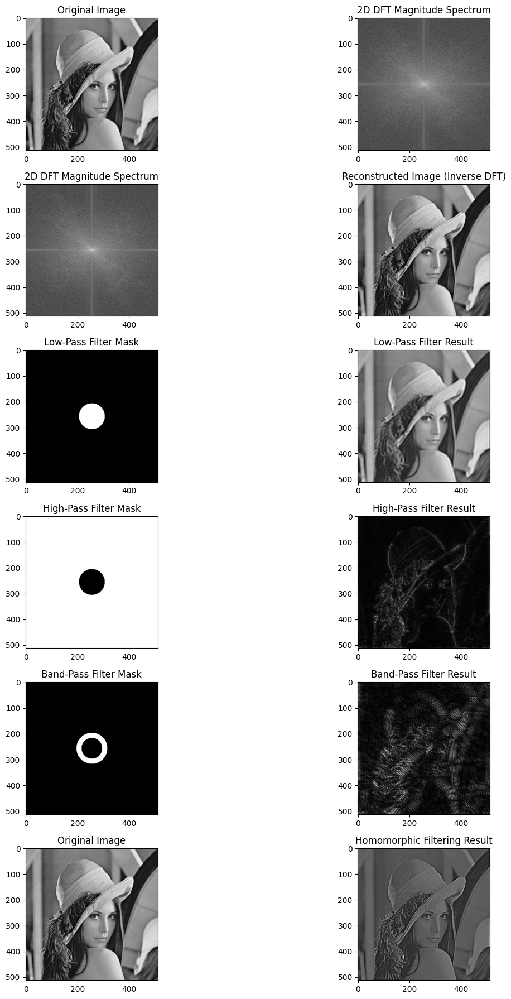

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
image = cv2.imread("/content/lenna.png", cv2.IMREAD_GRAYSCALE)

# --- 1. 2D Discrete Fourier Transform (DFT) and Inverse ---
def apply_dft(image):
    dft = np.fft.fft2(image)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(np.abs(dft_shift))
    return dft, dft_shift, magnitude_spectrum

def apply_idft(dft_shift):
    dft_ishift = np.fft.ifftshift(dft_shift)
    reconstructed_image = np.abs(np.fft.ifft2(dft_ishift))
    return reconstructed_image

dft, dft_shift, magnitude_spectrum = apply_dft(image)
reconstructed_image = apply_idft(dft_shift)

# --- 2. Design Filters in the Frequency Domain ---
def create_filter(shape, filter_type, d0, w=10):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.float32)

    if filter_type == "low-pass":
        for i in range(rows):
            for j in range(cols):
                if np.sqrt((i - crow) ** 2 + (j - ccol) ** 2) <= d0:
                    mask[i, j] = 1

    elif filter_type == "high-pass":
        for i in range(rows):
            for j in range(cols):
                if np.sqrt((i - crow) ** 2 + (j - ccol) ** 2) > d0:
                    mask[i, j] = 1

    elif filter_type == "band-pass":
        for i in range(rows):
            for j in range(cols):
                d = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
                if d0 - w / 2 < d < d0 + w / 2:
                    mask[i, j] = 1

    return mask

# Apply filters
low_pass_filter = create_filter(image.shape, "low-pass", d0=50)
high_pass_filter = create_filter(image.shape, "high-pass", d0=50)
band_pass_filter = create_filter(image.shape, "band-pass", d0=50, w=20)

low_pass_result = apply_idft(dft_shift * low_pass_filter)
high_pass_result = apply_idft(dft_shift * high_pass_filter)
band_pass_result = apply_idft(dft_shift * band_pass_filter)

# --- 3. Homomorphic Filtering ---
def homomorphic_filter(image, gamma_low=0.5, gamma_high=1.5, c=1, d0=50):
    rows, cols = image.shape
    image_log = np.log1p(np.float32(image))  # Log transform
    dft = np.fft.fft2(image_log)
    dft_shift = np.fft.fftshift(dft)

    # Create high-pass filter
    filter = np.zeros((rows, cols), np.float32)
    crow, ccol = rows // 2, cols // 2
    for i in range(rows):
        for j in range(cols):
            d = np.sqrt((i - crow) ** 2 + (j - ccol) ** 2)
            filter[i, j] = (gamma_high - gamma_low) * (1 - np.exp(-c * (d ** 2 / d0 ** 2))) + gamma_low

    filtered_dft = dft_shift * filter
    dft_ishift = np.fft.ifftshift(filtered_dft)
    result = np.exp(np.real(np.fft.ifft2(dft_ishift))) - 1  # Exponentiate and subtract 1
    result = np.uint8(np.clip(result, 0, 255))  # Clip to valid range
    return result

homomorphic_result = homomorphic_filter(image)

# --- Display Results in Desired Layout ---
plt.figure(figsize=(15, 18))

# Row 1: Original Image and 2D DFT
plt.subplot(6, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

plt.subplot(6, 2, 2)
plt.title("2D DFT Magnitude Spectrum")
plt.imshow(magnitude_spectrum, cmap='gray')

# Row 2: 2D DFT and Inverse Image
plt.subplot(6, 2, 3)
plt.title("2D DFT Magnitude Spectrum")
plt.imshow(magnitude_spectrum, cmap='gray')

plt.subplot(6, 2, 4)
plt.title("Reconstructed Image (Inverse DFT)")
plt.imshow(reconstructed_image, cmap='gray')

# Row 3: Low-Pass Mask and Low-Pass Result
plt.subplot(6, 2, 5)
plt.title("Low-Pass Filter Mask")
plt.imshow(low_pass_filter, cmap='gray')

plt.subplot(6, 2, 6)
plt.title("Low-Pass Filter Result")
plt.imshow(low_pass_result, cmap='gray')

# Row 4: High-Pass Mask and High-Pass Result
plt.subplot(6, 2, 7)
plt.title("High-Pass Filter Mask")
plt.imshow(high_pass_filter, cmap='gray')

plt.subplot(6, 2, 8)
plt.title("High-Pass Filter Result")
plt.imshow(high_pass_result, cmap='gray')

# Row 5: Band-Pass Mask and Band-Pass Result
plt.subplot(6, 2, 9)
plt.title("Band-Pass Filter Mask")
plt.imshow(band_pass_filter, cmap='gray')

plt.subplot(6, 2, 10)
plt.title("Band-Pass Filter Result")
plt.imshow(band_pass_result, cmap='gray')

# Row 6: Original Image and Homomorphic Filter Result
plt.subplot(6, 2, 11)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

plt.subplot(6, 2, 12)
plt.title("Homomorphic Filtering Result")
plt.imshow(homomorphic_result, cmap='gray')

plt.tight_layout()
plt.show()


D. Color Image Processing
1. Implement color space conversions between RGB, HSI, and YCbCr color models.
2. Perform color histogram equalization on a color image and analyze the results.
3. Implement color edge detection using Sobel or Canny operators.


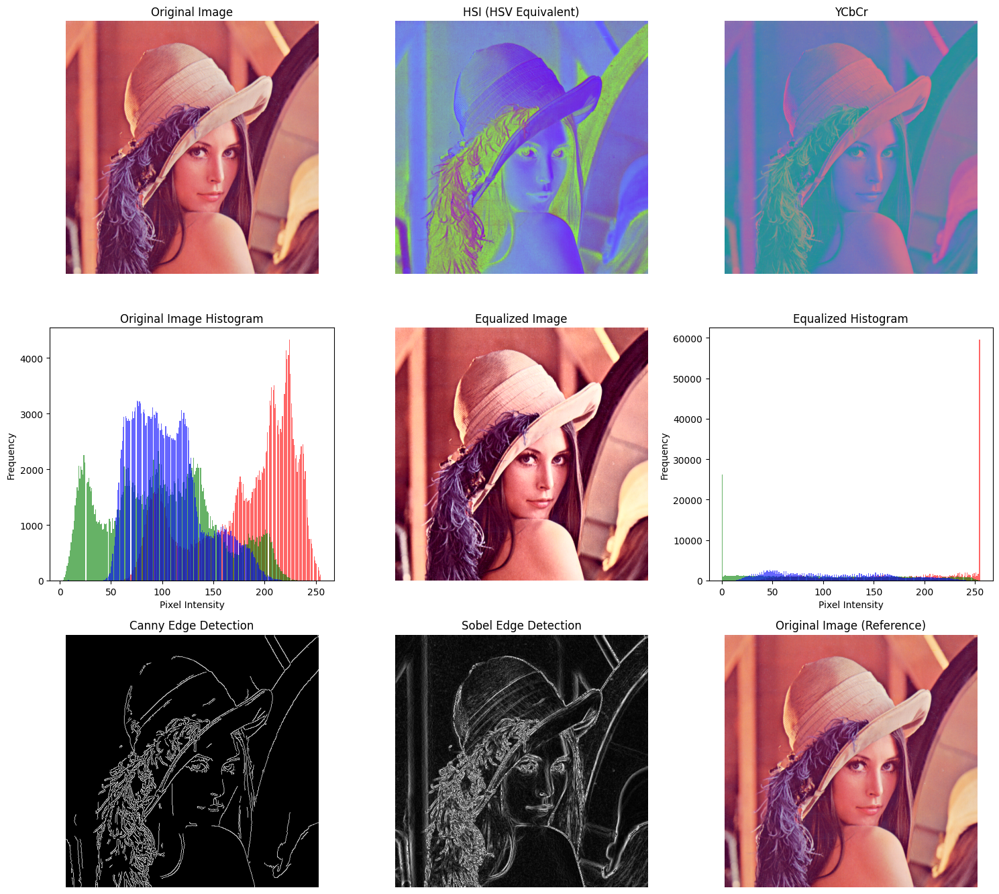

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the color image
image = cv2.imread('/content/lenna.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# --- 1. Color Space Conversions ---
# Convert to HSI
image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)  # HSV is analogous to HSI

# Convert to YCbCr
image_ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)

# --- 2. Color Histogram Equalization ---
def equalize_color_histogram(image):
    # Convert RGB to YCrCb
    ycrcb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    # Equalize the histogram of the Y channel
    ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
    # Convert back to RGB
    equalized = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2RGB)
    return equalized

equalized_image = equalize_color_histogram(image_rgb)

# --- 3. Color Edge Detection ---
def color_edge_detection(image, method='canny'):
    # Convert to grayscale for edge detection
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    if method == 'canny':
        edges = cv2.Canny(gray, 100, 200)  # Canny Edge Detection
    elif method == 'sobel':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        edges = cv2.magnitude(sobelx, sobely)
        edges = np.uint8(edges)
    return edges

edges_canny = color_edge_detection(image_rgb, method='canny')
edges_sobel = color_edge_detection(image_rgb, method='sobel')

# --- Display Results ---
plt.figure(figsize=(15, 18))

# Original Image
plt.subplot(4, 3, 1)
plt.title("Original Image")
plt.imshow(image_rgb)
plt.axis('off')

# HSI Image
plt.subplot(4, 3, 2)
plt.title("HSI (HSV Equivalent)")
plt.imshow(image_hsv)
plt.axis('off')

# YCbCr Image
plt.subplot(4, 3, 3)
plt.title("YCbCr")
plt.imshow(image_ycbcr)
plt.axis('off')

# Original Histogram
plt.subplot(4, 3, 4)
plt.title("Original Image Histogram")
for i, color in enumerate(['r', 'g', 'b']):
    plt.hist(image_rgb[:, :, i].ravel(), bins=256, color=color, alpha=0.6)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Equalized Image
plt.subplot(4, 3, 5)
plt.title("Equalized Image")
plt.imshow(equalized_image)
plt.axis('off')

# Equalized Histogram
plt.subplot(4, 3, 6)
plt.title("Equalized Histogram")
for i, color in enumerate(['r', 'g', 'b']):
    plt.hist(equalized_image[:, :, i].ravel(), bins=256, color=color, alpha=0.6)
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

# Canny Edge Detection
plt.subplot(4, 3, 7)
plt.title("Canny Edge Detection")
plt.imshow(edges_canny, cmap='gray')
plt.axis('off')

# Sobel Edge Detection
plt.subplot(4, 3, 8)
plt.title("Sobel Edge Detection")
plt.imshow(edges_sobel, cmap='gray')
plt.axis('off')

# Original Image for Reference
plt.subplot(4, 3, 9)
plt.title("Original Image (Reference)")
plt.imshow(image_rgb)
plt.axis('off')

plt.tight_layout()
plt.show()


E. Image Segmentation: Implement thresholding, region-based, and edge-based segmentation
  techniques.


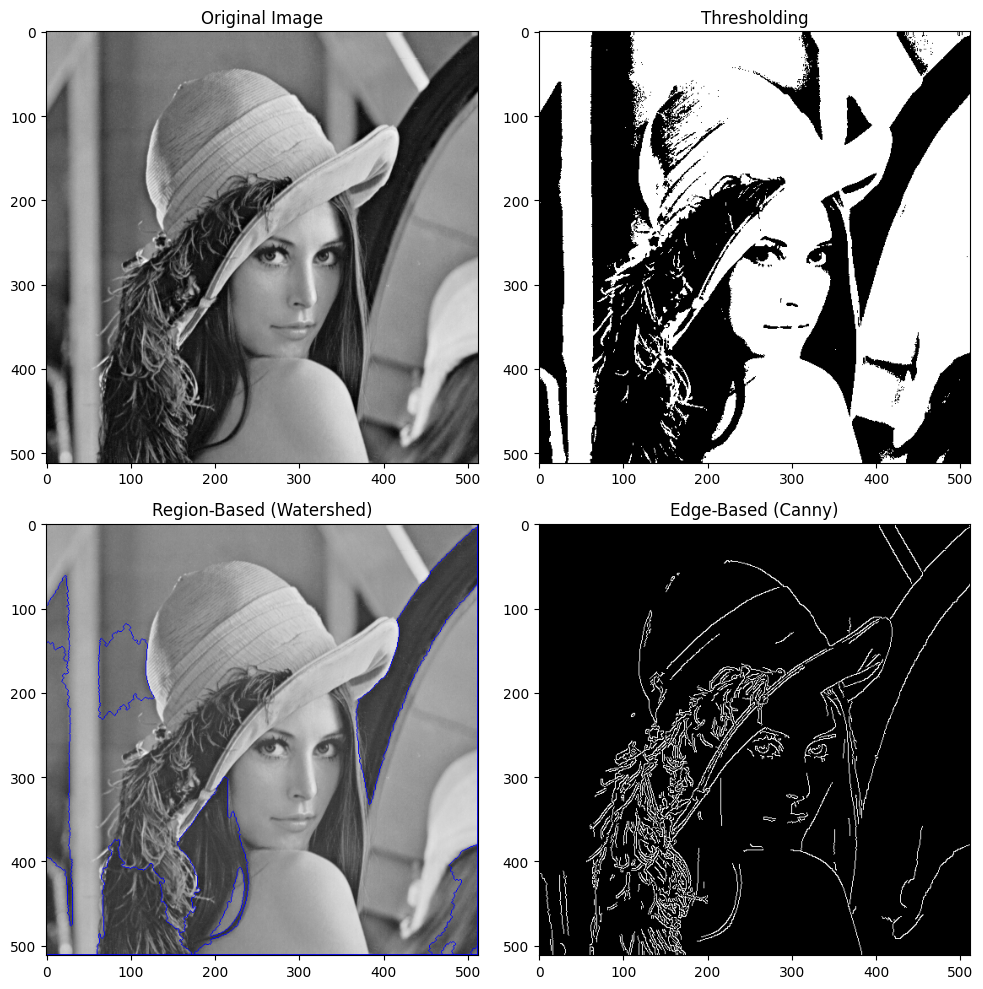

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE)

# --- 1. Thresholding Segmentation ---
def threshold_segmentation(image, thresh_value=127):
    _, binary = cv2.threshold(image, thresh_value, 255, cv2.THRESH_BINARY)
    return binary

thresholded_image = threshold_segmentation(image)

# --- 2. Region-Based Segmentation (Watershed) ---
def region_based_segmentation(image):
    # Convert to binary image
    _, binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Noise removal using morphological operations
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

    # Sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Unknown region
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Marker labelling
    _, markers = cv2.connectedComponents(sure_fg)

    # Add 1 to all labels so that the background is 1 instead of 0
    markers = markers + 1

    # Mark the unknown region as 0
    markers[unknown == 255] = 0

    # Watershed algorithm
    color_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(color_image, markers)
    color_image[markers == -1] = [255, 0, 0]  # Mark boundary in red

    return color_image

region_segmented_image = region_based_segmentation(image)

# --- 3. Edge-Based Segmentation ---
def edge_based_segmentation(image):
    edges = cv2.Canny(image, 100, 200)  # Canny Edge Detection
    return edges

edge_segmented_image = edge_based_segmentation(image)

# --- Display Results ---
plt.figure(figsize=(10, 10))

# Original Image
plt.subplot(2, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

# Thresholding
plt.subplot(2, 2, 2)
plt.title("Thresholding")
plt.imshow(thresholded_image, cmap='gray')

# Region-Based Segmentation
plt.subplot(2, 2, 3)
plt.title("Region-Based (Watershed)")
plt.imshow(cv2.cvtColor(region_segmented_image, cv2.COLOR_BGR2RGB))

# Edge-Based Segmentation
plt.subplot(2, 2, 4)
plt.title("Edge-Based (Canny)")
plt.imshow(edge_segmented_image, cmap='gray')

plt.tight_layout()
plt.show()


F. Image Morphological Processing: Perform erosion, dilation, opening, and closing operations
  on binary images.
  

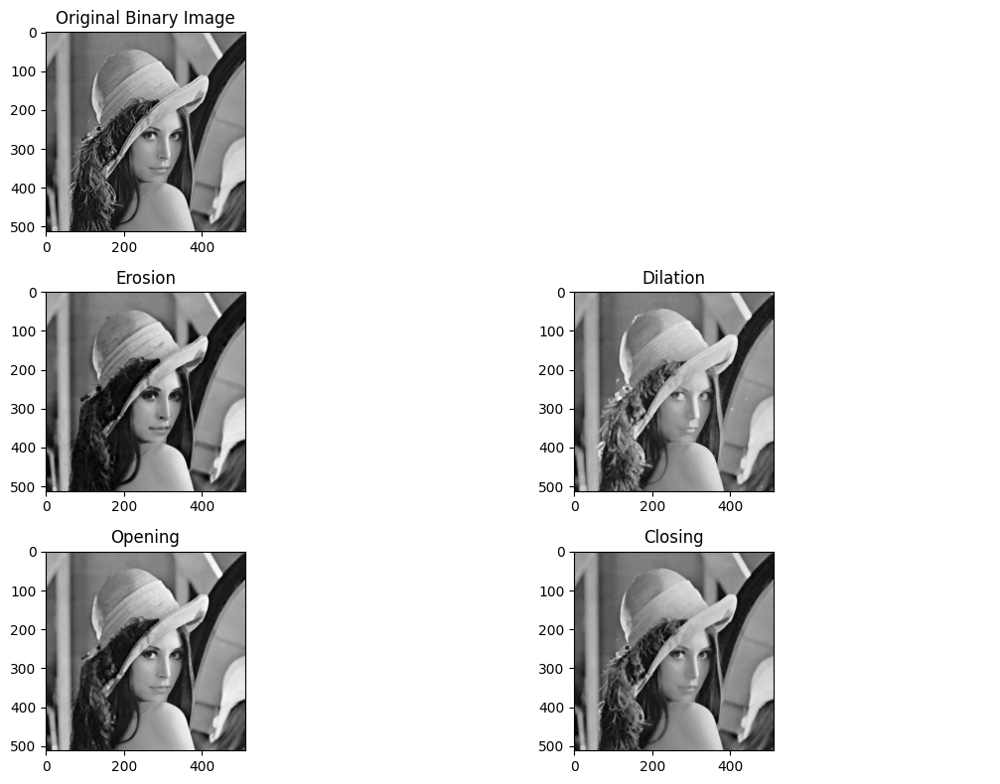

In [74]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the binary image
image = cv2.imread('/content/lenna.png', cv2.IMREAD_GRAYSCALE)

# Threshold the image to ensure it's binary
# _, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Define the kernel for morphological operations
kernel = np.ones((5, 5), np.uint8)

# --- 1. Erosion ---
def perform_erosion(image, kernel):
    eroded = cv2.erode(image, kernel, iterations=1)
    return eroded

eroded_image = perform_erosion(image, kernel)

# --- 2. Dilation ---
def perform_dilation(image, kernel):
    dilated = cv2.dilate(image, kernel, iterations=1)
    return dilated

dilated_image = perform_dilation(image, kernel)

# --- 3. Opening ---
def perform_opening(image, kernel):
    opened = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    return opened

opened_image = perform_opening(image, kernel)

# --- 4. Closing ---
def perform_closing(image, kernel):
    closed = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    return closed

closed_image = perform_closing(image, kernel)

# --- Display Results ---
plt.figure(figsize=(12, 8))

# Original Binary Image
plt.subplot(3, 2, 1)
plt.title("Original Binary Image")
plt.imshow(image, cmap='gray')

plt.subplot(3, 2, 2)
plt.axis('off')

# Erosion
plt.subplot(3, 2, 3)
plt.title("Erosion")
plt.imshow(eroded_image, cmap='gray')

# Dilation
plt.subplot(3, 2, 4)
plt.title("Dilation")
plt.imshow(dilated_image, cmap='gray')

# Opening
plt.subplot(3, 2, 5)
plt.title("Opening")
plt.imshow(opened_image, cmap='gray')

# Closing
plt.subplot(3, 2, 6)
plt.title("Closing")
plt.imshow(closed_image, cmap='gray')


plt.tight_layout()
plt.show()


G. Image Registration: Implement image registration techniques for aligning multiple images.


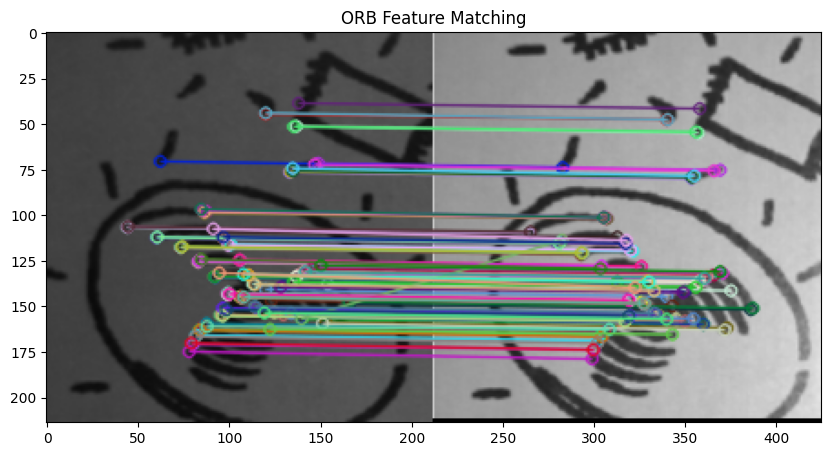

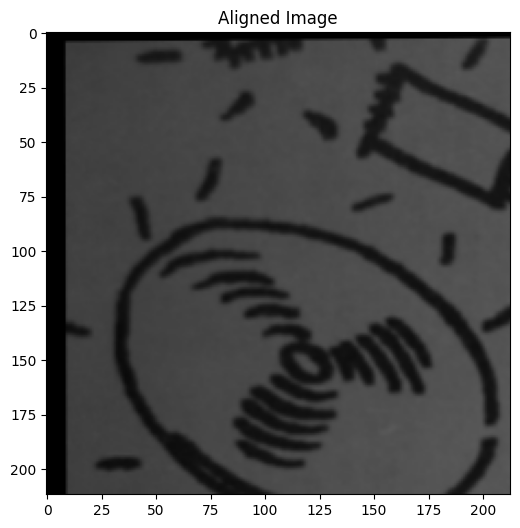

In [49]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def register_images(image1, image2):
    # Convert images to grayscale
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Initialize ORB detector
    orb = cv2.ORB_create()

    # Find the keypoints and descriptors with ORB
    kp1, des1 = orb.detectAndCompute(gray1, None)
    kp2, des2 = orb.detectAndCompute(gray2, None)

    # Use FLANN (Fast Library for Approximate Nearest Neighbors) for matching descriptors
    index_params = dict(algorithm=6, table_number=6, key_size=12, multi_probe_level=1)
    search_params = dict(checks=50)  # Higher number of checks will improve results but slower
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Match descriptors
    matches = flann.knnMatch(des1, des2, k=2)

    # Apply ratio test to keep good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Draw matches
    img_matches = cv2.drawMatches(image1, kp1, image2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Show matches
    plt.figure(figsize=(10, 6))
    plt.imshow(img_matches)
    plt.title("ORB Feature Matching")
    plt.show()

    # Find the homography matrix
    if len(good_matches) > 4:  # At least 4 matches are needed to compute homography
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

        # Compute the homography matrix using RANSAC
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        # Warp the first image to align with the second image
        h, w = gray2.shape
        aligned_image = cv2.warpPerspective(image1, M, (w, h))

        return aligned_image, M
    else:
        print("Not enough matches found!")
        return None, None

# Example usage
image1 = cv2.imread('/content/iR1.png')  # Path to the first image
image2 = cv2.imread('/content/iR2.png')  # Path to the second image

aligned_image, homography_matrix = register_images(image1, image2)

if aligned_image is not None:
    # Show the aligned image
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
    plt.title("Aligned Image")
    plt.show()
